<a href="https://colab.research.google.com/github/jrgee/CMPE297-98/blob/master/Assignment_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Imports

In [0]:
!pip install wget

  Created wheel for wget: filename=wget-3.2-cp36-none-any.whl size=9681 sha256=f8d169758c9386cef0721a7c2ac5552c1f1436248dbbe43ab41b12d1a3e7a649
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget


In [0]:
%matplotlib inline
%tensorflow_version 1.x
import os
from os import path

import tensorflow as tf
from tensorflow import keras

from keras import backend as K
from keras.layers import Input, Lambda, Conv2D, BatchNormalization, LeakyReLU, ZeroPadding2D, UpSampling2D
from keras.models import load_model, Model
from keras.layers.merge import add, concatenate
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array

import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from matplotlib.patches import Rectangle

import numpy as np
from numpy import expand_dims

import pandas as pd
import struct
import scipy.io
import scipy.misc

import wget

import PIL
import cv2
from skimage.transform import resize

print(tf.__version__)
print(tf.test.is_gpu_available())

1.15.0
True


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


# Yolo v3

using the implementation from https://towardsdatascience.com/object-detection-using-yolov3-using-keras-80bf35e61ce1



### Convert Weights
Functions to load mad convert the weights from the darknet yolo



the _conv_block() method provides a helpful function to wrap padding, conv2d, batchnorm and the activation function (leaky relu) in one method. It also supports skip connections.

In [0]:
weights_url = 'https://pjreddie.com/media/files/yolov3.weights'

if not(path.exists('/content/yolov3.weights')):
    print('downloading weights...')
    wget.download(weights_url, 'yolov3.weights', bar=bar_thermometer)
else:
    print('already downloaded')

already downloaded


In [0]:
class WeightReader:
    def __init__(self, weight_file):
        with open(weight_file, 'rb') as w_f:
            major,    = struct.unpack('i', w_f.read(4))
            minor,    = struct.unpack('i', w_f.read(4))
            revision, = struct.unpack('i', w_f.read(4))

            if (major*10 + minor) >= 2 and major < 1000 and minor < 1000:
                w_f.read(8)
            else:
                w_f.read(4)

            transpose = (major > 1000) or (minor > 1000)
            
            binary = w_f.read()

        self.offset = 0
        self.all_weights = np.frombuffer(binary, dtype='float32')
        
    def read_bytes(self, size):
        self.offset = self.offset + size
        return self.all_weights[self.offset-size:self.offset]

    def load_weights(self, model):
        for i in range(106):
            try:
                conv_layer = model.get_layer('conv_' + str(i))
                print("loading weights of convolution #" + str(i))

                if i not in [81, 93, 105]:
                    norm_layer = model.get_layer('bnorm_' + str(i))

                    size = np.prod(norm_layer.get_weights()[0].shape)

                    beta  = self.read_bytes(size) # bias
                    gamma = self.read_bytes(size) # scale
                    mean  = self.read_bytes(size) # mean
                    var   = self.read_bytes(size) # variance            

                    weights = norm_layer.set_weights([gamma, beta, mean, var])  

                if len(conv_layer.get_weights()) > 1:
                    bias   = self.read_bytes(np.prod(conv_layer.get_weights()[1].shape))
                    kernel = self.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
                    
                    kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
                    kernel = kernel.transpose([2,3,1,0])
                    conv_layer.set_weights([kernel, bias])
                else:
                    kernel = self.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
                    kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
                    kernel = kernel.transpose([2,3,1,0])
                    conv_layer.set_weights([kernel])
            except ValueError:
                print("no convolution #" + str(i))     
    
    def reset(self):
        self.offset = 0

In [0]:
def _conv_block(inp, convs, skip=True):
    x = inp
    count = 0
    
    for conv in convs:
        if count == (len(convs) - 2) and skip:
            skip_connection = x
        count += 1
        
        if conv['stride'] > 1: x = ZeroPadding2D(((1,0),(1,0)))(x) # peculiar padding as darknet prefer left and top
        x = Conv2D(conv['filter'], 
                   conv['kernel'], 
                   strides=conv['stride'], 
                   padding='valid' if conv['stride'] > 1 else 'same', # peculiar padding as darknet prefer left and top
                   name='conv_' + str(conv['layer_idx']), 
                   use_bias=False if conv['bnorm'] else True)(x)
        if conv['bnorm']: x = BatchNormalization(epsilon=0.001, name='bnorm_' + str(conv['layer_idx']))(x)
        if conv['leaky']: x = LeakyReLU(alpha=0.1, name='leaky_' + str(conv['layer_idx']))(x)

    return add([skip_connection, x]) if skip else x

# creating the YOLO model
def make_yolov3_model():
    input_image = Input(shape=(None, None, 3))

    # Layer  0 => 4
    x = _conv_block(input_image, [{'filter': 32, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 0},
                                  {'filter': 64, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 1},
                                  {'filter': 32, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 2},
                                  {'filter': 64, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 3}])

    # Layer  5 => 8
    x = _conv_block(x, [{'filter': 128, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 5},
                        {'filter':  64, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 6},
                        {'filter': 128, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 7}])

    # Layer  9 => 11
    x = _conv_block(x, [{'filter':  64, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 9},
                        {'filter': 128, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 10}])

    # Layer 12 => 15
    x = _conv_block(x, [{'filter': 256, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 12},
                        {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 13},
                        {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 14}])

    # Layer 16 => 36
    for i in range(7):
        x = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 16+i*3},
                            {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 17+i*3}])
        
    skip_36 = x
        
    # Layer 37 => 40
    x = _conv_block(x, [{'filter': 512, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 37},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 38},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 39}])

    # Layer 41 => 61
    for i in range(7):
        x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 41+i*3},
                            {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 42+i*3}])
        
    skip_61 = x
        
    # Layer 62 => 65
    x = _conv_block(x, [{'filter': 1024, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 62},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 63},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 64}])

    # Layer 66 => 74
    for i in range(3):
        x = _conv_block(x, [{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 66+i*3},
                            {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 67+i*3}])
        
    # Layer 75 => 79
    x = _conv_block(x, [{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 75},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 76},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 77},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 78},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 79}], skip=False)

    # Layer 80 => 82
    yolo_82 = _conv_block(x, [{'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 80},
                              {'filter':  255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 81}], skip=False)

    # Layer 83 => 86
    x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 84}], skip=False)
    x = UpSampling2D(2)(x)
    x = concatenate([x, skip_61])

    # Layer 87 => 91
    x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 87},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 88},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 89},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 90},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 91}], skip=False)

    # Layer 92 => 94
    yolo_94 = _conv_block(x, [{'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 92},
                              {'filter': 255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 93}], skip=False)

    # Layer 95 => 98
    x = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True,   'layer_idx': 96}], skip=False)
    x = UpSampling2D(2)(x)
    x = concatenate([x, skip_36])

    # Layer 99 => 106
    yolo_106 = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 99},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 100},
                               {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 101},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 102},
                               {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 103},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 104},
                               {'filter': 255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 105}], skip=False)

    model = Model(input_image, [yolo_82, yolo_94, yolo_106])    
    return model

### Build Model

build the model from the darknet weights, then convert them into keras weights and use the converted model

In [0]:
# # create the yolo v3 from the darknet weights
# yolov3 = make_yolov3_model()
# # load the weights trained on COCO into the model
# weight_reader = WeightReader('yolov3.weights')
# weight_reader.load_weights(yolov3)
# yolov3.summary()
# save the model to file
# yolov3.save('yolov3.h5')

In [0]:
yolov3 = keras.models.load_model('/content/drive/My Drive/297-98/yolov3.h5')
yolov3.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv_0 (Conv2D)                 (None, None, None, 3 864         input_2[0][0]                    
__________________________________________________________________________________________________
bnorm_0 (BatchNormalization)    (None, None, None, 3 128         conv_0[0][0]                     
__________________________________________________________________________________________________
leaky_0 (LeakyReLU)             (None, None, None, 3 0           bnorm_0[0][0]                    
___________

In [0]:
# thresholds and labels for objects in yolo

net_h, net_w = 416, 416
obj_thresh, nms_thresh = 0.5, 0.45
anchors = [[116,90,  156,198,  373,326],  [30,61, 62,45,  59,119], [10,13,  16,30,  33,23]]
labels = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck", \
              "boat", "traffic light", "fire hydrant", "stop sign", "parking meter", "bench", \
              "bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe", \
              "backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard", \
              "sports ball", "kite", "baseball bat", "baseball glove", "skateboard", "surfboard", \
              "tennis racket", "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana", \
              "apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake", \
              "chair", "sofa", "pottedplant", "bed", "diningtable", "toilet", "tvmonitor", "laptop", "mouse", \
              "remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator", \
              "book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"]


### Load image



In [0]:
def load_image_pixels(filename, shape):
    # load the image to get its shape
    image = load_img(filename)
    width, height = image.size
    # load the image with the required size
    image = load_img(filename, target_size=shape)
    # convert to numpy array
    image = img_to_array(image)
    # scale pixel values to [0, 1]
    image = image.astype('float32')
    image /= 255.0
    # add a dimension so that we have one sample
    image = expand_dims(image, 0)
    return image, width, height

In [0]:
# define the expected input shape for the model
input_w, input_h = 416, 416
# define our new photo

img_file = 'toilet_w_plant.jpg'

if not(path.exists('/content/'+img_file)):
    img_url = 'https://www.thespruce.com/thmb/jGLenl-BxUuv3bkUrrJqRgvNKBo=/1160x1168/filters:no_upscale():max_bytes(150000):strip_icc()/GJMgXV-a3109266c5444cc2933f781286ccfc80.jpg'
    wget.download(img_url, img_file)
else:
    print('already loaded')

# load and prepare image
image, image_w, image_h = load_image_pixels(img_file, (input_w, input_h))

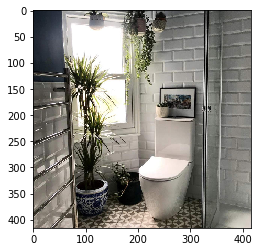

In [0]:
plt.imshow(np.squeeze(image, axis=0))
plt.show()

### Helper Functions

this section contains helper functions that handle the output of yolo to properly creata the bounding boxes over the image


In [0]:
class BoundBox:
    def __init__(self, xmin, ymin, xmax, ymax, objness = None, classes = None):
        self.xmin = xmin
        self.ymin = ymin
        self.xmax = xmax
        self.ymax = ymax
        
        self.objness = objness
        self.classes = classes

        self.label = -1
        self.score = -1

    def get_label(self):
        if self.label == -1:
            self.label = np.argmax(self.classes)
        
        return self.label
    
    def get_score(self):
        if self.score == -1:
            self.score = self.classes[self.get_label()]
            
        return self.score

def _sigmoid(x):
    return 1. / (1. + np.exp(-x))

def _interval_overlap(interval_a, interval_b):
    x1, x2 = interval_a
    x3, x4 = interval_b

    if x3 < x1:
        if x4 < x1:
            return 0
        else:
            return min(x2,x4) - x1
    else:
        if x2 < x3:
             return 0
        else:
            return min(x2,x4) - x3 
def bbox_iou(box1, box2):
    intersect_w = _interval_overlap([box1.xmin, box1.xmax], [box2.xmin, box2.xmax])
    intersect_h = _interval_overlap([box1.ymin, box1.ymax], [box2.ymin, box2.ymax])
    
    intersect = intersect_w * intersect_h

    w1, h1 = box1.xmax-box1.xmin, box1.ymax-box1.ymin
    w2, h2 = box2.xmax-box2.xmin, box2.ymax-box2.ymin
    
    union = w1*h1 + w2*h2 - intersect
    
    return float(intersect) / union

def do_nms(boxes, nms_thresh):
    if len(boxes) > 0:
        nb_class = len(boxes[0].classes)
    else:
        return
        
    for c in range(nb_class):
        sorted_indices = np.argsort([-box.classes[c] for box in boxes])

        for i in range(len(sorted_indices)):
            index_i = sorted_indices[i]

            if boxes[index_i].classes[c] == 0: continue

            for j in range(i+1, len(sorted_indices)):
                index_j = sorted_indices[j]

                if bbox_iou(boxes[index_i], boxes[index_j]) >= nms_thresh:
                    boxes[index_j].classes[c] = 0

In [0]:
#decode_netout() that will take each one of the NumPy arrays, one at a time, 
#and decode the candidate bounding boxes and class predictions
def decode_netout(netout, anchors, obj_thresh,  net_h, net_w):
    grid_h, grid_w = netout.shape[:2]
    nb_box = 3
    netout = netout.reshape((grid_h, grid_w, nb_box, -1))
    nb_class = netout.shape[-1] - 5

    boxes = []

    netout[..., :2]  = _sigmoid(netout[..., :2])
    netout[..., 4:]  = _sigmoid(netout[..., 4:])
    netout[..., 5:]  = netout[..., 4][..., np.newaxis] * netout[..., 5:]
    netout[..., 5:] *= netout[..., 5:] > obj_thresh

    for i in range(grid_h*grid_w):
        row = i / grid_w
        col = i % grid_w
        
        for b in range(nb_box):
            # 4th element is objectness score
            objectness = netout[int(row)][int(col)][b][4]
            #objectness = netout[..., :4]
            
            if(objectness.all() <= obj_thresh): continue
            
            # first 4 elements are x, y, w, and h
            x, y, w, h = netout[int(row)][int(col)][b][:4]

            x = (col + x) / grid_w # center position, unit: image width
            y = (row + y) / grid_h # center position, unit: image height
            w = anchors[2 * b + 0] * np.exp(w) / net_w # unit: image width
            h = anchors[2 * b + 1] * np.exp(h) / net_h # unit: image height  
            
            # last elements are class probabilities
            classes = netout[int(row)][col][b][5:]
            
            box = BoundBox(x-w/2, y-h/2, x+w/2, y+h/2, objectness, classes)
            #box = BoundBox(x-w/2, y-h/2, x+w/2, y+h/2, None, classes)

            boxes.append(box)

    return boxes

In [0]:
# bounding boxes will be stretched back into the shape of the original image
#will allow plotting the original image and draw the bounding boxes, hopefully detecting real objects.
# correct the sizes of the bounding boxes for the shape of the image
#correct_yolo_boxes(boxes, image_h, image_w, input_h, input_w)
def correct_yolo_boxes(boxes, image_h, image_w, net_h, net_w):
    if (float(net_w)/image_w) < (float(net_h)/image_h):
        new_w = net_w
        new_h = (image_h*net_w)/image_w
    else:
        new_h = net_w
        new_w = (image_w*net_h)/image_h
        
    for i in range(len(boxes)):
        x_offset, x_scale = (net_w - new_w)/2./net_w, float(new_w)/net_w
        y_offset, y_scale = (net_h - new_h)/2./net_h, float(new_h)/net_h
        
        boxes[i].xmin = int((boxes[i].xmin - x_offset) / x_scale * image_w)
        boxes[i].xmax = int((boxes[i].xmax - x_offset) / x_scale * image_w)
        boxes[i].ymin = int((boxes[i].ymin - y_offset) / y_scale * image_h)
        boxes[i].ymax = int((boxes[i].ymax - y_offset) / y_scale * image_h)

In [0]:
def draw_boxes(filename, v_boxes, v_labels, v_scores):
    # load the image
    data = plt.imread(filename)
    # plot the image
    plt.imshow(data)
    # get the context for drawing boxes
    ax = plt.gca()
    # plot each box
    for i in range(len(v_boxes)):
        box = v_boxes[i]
        # get coordinates
        y1, x1, y2, x2 = box.ymin, box.xmin, box.ymax, box.xmax
        # calculate width and height of the box
        width, height = x2 - x1, y2 - y1
        # create the shape
        rect = Rectangle((x1, y1), width, height, fill=False, color='red')
        # draw the box
        ax.add_patch(rect)
        # draw text and score in top left corner
        label = "%s (%.3f)" % (v_labels[i], v_scores[i])
        plt.text(x1, y1, label, color='red')
    # show the plot
    plt.show()

In [0]:
# get all of the results above a threshold
# takes the list of boxes, known labels, 
#and our classification threshold as arguments and returns parallel lists of boxes, labels, and scores.
def get_boxes(boxes, labels, thresh):
    v_boxes, v_labels, v_scores = list(), list(), list()
    # enumerate all boxes
    for box in boxes:
        # enumerate all possible labels
        for i in range(len(labels)):
            # check if the threshold for this label is high enough
            if box.classes[i] > thresh:
                v_boxes.append(box)
                v_labels.append(labels[i])
                v_scores.append(box.classes[i]*100)
                # don't break, many labels may trigger for one box
    return v_boxes, v_labels, v_scores

### Make Prediction

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]
pottedplant 99.19508695602417
toilet 95.10846138000488
pottedplant 91.93385243415833


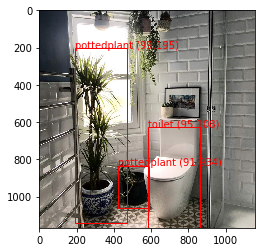

In [0]:
# make prediction
yolos = yolov3.predict(image)
# summarize the shape of the list of arrays
print([a.shape for a in yolos])

# define the anchors
anchors = [[116,90, 156,198, 373,326], [30,61, 62,45, 59,119], [10,13, 16,30, 33,23]]
# define the probability threshold for detected objects
class_threshold = 0.6
boxes = list()

for i in range(len(yolos)):
        # decode the output of the network
    boxes += decode_netout(yolos[i][0], anchors[i], obj_thresh,  net_h, net_w)

    # correct the sizes of the bounding boxes
correct_yolo_boxes(boxes, image_h, image_w, net_h, net_w)

# suppress non-maximal boxes
do_nms(boxes, nms_thresh)

# get the details of the detected objects
v_boxes, v_labels, v_scores = get_boxes(boxes, labels, class_threshold)
# summarize what we found
for i in range(len(v_boxes)):
    print(v_labels[i], v_scores[i])
# draw what we found
draw_boxes(img_file, v_boxes, v_labels, v_scores)

# Deeplab+

using the implementation from https://colab.research.google.com/github/tensorflow/models/blob/master/research/deeplab/deeplab_demo.ipynb#scrollTo=c4oXKmnjw6i_

### Imports

In [0]:
import os
from io import BytesIO
import tarfile
import tempfile
from six.moves import urllib

from matplotlib import gridspec
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image

import tensorflow as tf

### Helper Functions

The class holds the model

These functions help display the images and the proper segmentation mask that the network predicts

In [0]:
class DeepLabModel(object):
  """Class to load deeplab model and run inference."""

  INPUT_TENSOR_NAME = 'ImageTensor:0'
  OUTPUT_TENSOR_NAME = 'SemanticPredictions:0'
  INPUT_SIZE = 513
  FROZEN_GRAPH_NAME = 'frozen_inference_graph'

  def __init__(self, tarball_path):
    """Creates and loads pretrained deeplab model."""
    self.graph = tf.Graph()

    graph_def = None
    # Extract frozen graph from tar archive.
    tar_file = tarfile.open(tarball_path)
    for tar_info in tar_file.getmembers():
      if self.FROZEN_GRAPH_NAME in os.path.basename(tar_info.name):
        file_handle = tar_file.extractfile(tar_info)
        graph_def = tf.GraphDef.FromString(file_handle.read())
        break

    tar_file.close()

    if graph_def is None:
      raise RuntimeError('Cannot find inference graph in tar archive.')

    with self.graph.as_default():
      tf.import_graph_def(graph_def, name='')

    self.sess = tf.Session(graph=self.graph)

  def run(self, image):
    """Runs inference on a single image.

    Args:
      image: A PIL.Image object, raw input image.

    Returns:
      resized_image: RGB image resized from original input image.
      seg_map: Segmentation map of `resized_image`.
    """
    width, height = image.size
    resize_ratio = 1.0 * self.INPUT_SIZE / max(width, height)
    target_size = (int(resize_ratio * width), int(resize_ratio * height))
    resized_image = image.convert('RGB').resize(target_size, Image.ANTIALIAS)
    batch_seg_map = self.sess.run(
        self.OUTPUT_TENSOR_NAME,
        feed_dict={self.INPUT_TENSOR_NAME: [np.asarray(resized_image)]})
    seg_map = batch_seg_map[0]
    return resized_image, seg_map


In [0]:
def create_pascal_label_colormap():
  """Creates a label colormap used in PASCAL VOC segmentation benchmark.

  Returns:
    A Colormap for visualizing segmentation results.
  """
  colormap = np.zeros((256, 3), dtype=int)
  ind = np.arange(256, dtype=int)

  for shift in reversed(range(8)):
    for channel in range(3):
      colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

  return colormap


def label_to_color_image(label):
  """Adds color defined by the dataset colormap to the label.

  Args:
    label: A 2D array with integer type, storing the segmentation label.

  Returns:
    result: A 2D array with floating type. The element of the array
      is the color indexed by the corresponding element in the input label
      to the PASCAL color map.

  Raises:
    ValueError: If label is not of rank 2 or its value is larger than color
      map maximum entry.
  """
  if label.ndim != 2:
    raise ValueError('Expect 2-D input label')

  colormap = create_pascal_label_colormap()

  if np.max(label) >= len(colormap):
    raise ValueError('label value too large.')

  return colormap[label]


def vis_segmentation(image, seg_map):
  """Visualizes input image, segmentation map and overlay view."""
  plt.figure(figsize=(15, 5))
  grid_spec = gridspec.GridSpec(1, 4, width_ratios=[6, 6, 6, 1])

  plt.subplot(grid_spec[0])
  plt.imshow(image)
  plt.axis('off')
  plt.title('input image')

  plt.subplot(grid_spec[1])
  seg_image = label_to_color_image(seg_map).astype(np.uint8)
  plt.imshow(seg_image)
  plt.axis('off')
  plt.title('segmentation map')

  plt.subplot(grid_spec[2])
  plt.imshow(image)
  plt.imshow(seg_image, alpha=0.7)
  plt.axis('off')
  plt.title('segmentation overlay')

  unique_labels = np.unique(seg_map)
  ax = plt.subplot(grid_spec[3])
  plt.imshow(
      FULL_COLOR_MAP[unique_labels].astype(np.uint8), interpolation='nearest')
  ax.yaxis.tick_right()
  plt.yticks(range(len(unique_labels)), LABEL_NAMES[unique_labels])
  plt.xticks([], [])
  ax.tick_params(width=0.0)
  plt.grid('off')
  plt.show()


LABEL_NAMES = np.asarray([
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
])

FULL_LABEL_MAP = np.arange(len(LABEL_NAMES)).reshape(len(LABEL_NAMES), 1)
FULL_COLOR_MAP = label_to_color_image(FULL_LABEL_MAP)

### Load Model

Here, I load the mobilenet version of deeplab to keep the computation down

In [0]:
model_url = 'http://download.tensorflow.org/models/' + 'deeplabv3_mnv2_pascal_train_aug_2018_01_29.tar.gz'

tarball_name = 'deeplab_model.tar.gz'

model_dir = tempfile.mkdtemp()
tf.gfile.MakeDirs(model_dir)

download_path = os.path.join(model_dir, tarball_name)


print('downloading model, this might take a while...')
urllib.request.urlretrieve(model_url, download_path)
print('download completed! loading DeepLab model...')

MODEL = DeepLabModel(download_path)
print('model loaded successfully!')

downloading model, this might take a while...
download completed! loading DeepLab model...
model loaded successfully!


### Make Prediction

Here we use a picture of a man riding a cow to see if the network can properly find a cow rather than a horse.



In [0]:
def run_visualization(url):
  """Inferences DeepLab model and visualizes result."""
  try:
    f = urllib.request.urlopen(url)
    jpeg_str = f.read()
    original_im = Image.open(BytesIO(jpeg_str))
  except IOError:
    print('Cannot retrieve image. Please check url: ' + url)
    return

  print('running deeplab on image %s...' % url)
  resized_im, seg_map = MODEL.run(original_im)

  vis_segmentation(resized_im, seg_map)

running deeplab on image https://1funny.com/wp-content/uploads/2009/06/cow-riding.jpg...


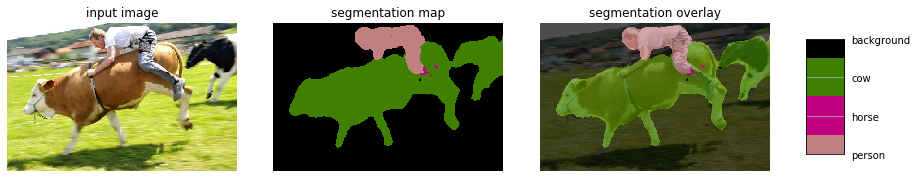

In [0]:
image_url = 'https://1funny.com/wp-content/uploads/2009/06/cow-riding.jpg'
run_visualization(image_url)

running deeplab on image https://www.ukgser.com/forums/attachment.php?attachmentid=215877&stc=1&d=1352071407...


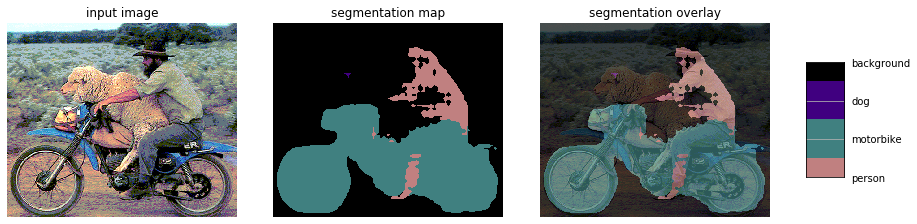

In [0]:
image_url = 'https://www.ukgser.com/forums/attachment.php?attachmentid=215877&stc=1&d=1352071407'
run_visualization(image_url)

running deeplab on image https://www.thespruce.com/thmb/jGLenl-BxUuv3bkUrrJqRgvNKBo=/1160x1168/filters:no_upscale():max_bytes(150000):strip_icc()/GJMgXV-a3109266c5444cc2933f781286ccfc80.jpg...


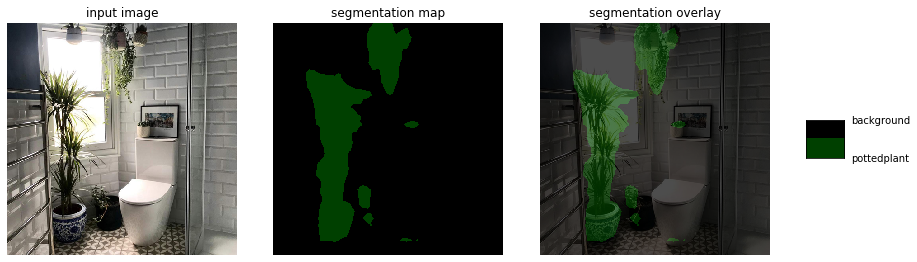

In [0]:
image_url = 'https://www.thespruce.com/thmb/jGLenl-BxUuv3bkUrrJqRgvNKBo=/1160x1168/filters:no_upscale():max_bytes(150000):strip_icc()/GJMgXV-a3109266c5444cc2933f781286ccfc80.jpg'
run_visualization(image_url)

running deeplab on image https://c8.alamy.com/comp/EBF4B1/bird-sitting-on-the-cows-back-EBF4B1.jpg...


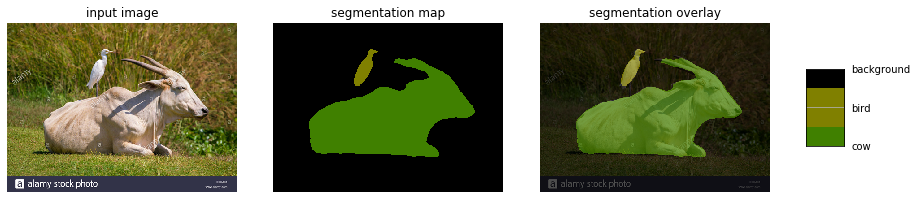

In [0]:
image_url = 'https://c8.alamy.com/comp/EBF4B1/bird-sitting-on-the-cows-back-EBF4B1.jpg'
run_visualization(image_url)

# Facenet

Facenet is a way to do embeddings on faces. Use some other predictor to predict on the embeddings. Here, I use support vector classification, an easy way to separate out embeded information.

### Imports

In [0]:
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image
from scipy import spatial
from keras.models import load_model

from scipy.spatial import distance_matrix

import glob
import pandas as pd

import cv2
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import proj3d
from imageio import imread
from skimage.transform import resize
from scipy.spatial import distance

from PIL import Image
import requests
from io import BytesIO


%matplotlib inline

### Load Facenet Model

In [0]:
model_path = '/content/drive/My Drive/297-98/facenet_keras.h5'
model = load_model(model_path)
model.summary()













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:310: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


Model: "inception_resnet_v1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 160, 160, 3)  0                                            
__________________________________________________________________________________________________
Conv2d_1a_3x3 (Conv2D)          (None, 79, 79, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
Conv2d_1a_3x3_BatchNorm (BatchN (None, 79, 79, 32)   96          Conv2d_1a_3x3[0][0]              
__________________________________________________________________________________________________
Conv2d_1a_3x3_Activation (Activ (None, 79, 79, 32)   0           Conv2d_1a_3x3_BatchNorm[0][0]    
________________________________________________________________________________

### Helper Functions

these functions help preprocess the input

In [0]:
def extract_features(filename):
    height = 160
    width = 160
    img = Image.open(filename)
    img = img.resize((width, height))

    input_data = np.expand_dims(img, axis=0)
    input_data = (np.float32(input_data) - 128) / 128

    results = model.predict(input_data)
    return results

In [0]:
embeddings = pd.DataFrame(columns=['name', 'emb'])

c = 0
for files in glob.glob('/content/drive/My Drive/297-98/facenet_images/*/*'):
    features = extract_features(files)
    embeddings.loc[c, 'name'] = os.path.basename(os.path.dirname(files))
    embeddings.loc[c, 'emb'] = np.asarray(features[0])
    c += 1

embeddings

,name,emb
0,guy_fieri,"[-0.44083783, -0.3981251, 0.4889033, -0.734692..."
1,guy_fieri,"[-0.06371397, -0.10426107, -0.56896913, 0.5881..."
2,guy_fieri,"[0.33826497, 0.33912545, 0.16524667, -0.837202..."
3,barak_obama,"[-0.16015634, -0.6019896, -0.38011938, -0.3083..."
4,barak_obama,"[0.1567984, 0.070139945, 0.29791722, -1.415897..."
5,barak_obama,"[-0.40468055, -0.057797812, 0.067926325, -0.65..."
6,samuel_jackson,"[-1.352478, 0.042623006, -0.51608217, -0.72117..."
7,samuel_jackson,"[0.18396208, -0.32717493, 0.32368878, 0.317011..."
8,samuel_jackson,"[0.83368397, 0.20032114, -0.13149683, 0.158458..."


In [0]:
from scipy.spatial import distance_matrix
dist_mat = distance_matrix(np.vstack(embeddings['emb']), np.vstack(embeddings['emb']))
dist_mat

array([[ 0.       ,  7.653138 ,  7.9862123,  5.525696 ,  6.2186313,
         7.878605 , 13.290566 ,  8.5480585, 13.038063 ],
       [ 7.653138 ,  0.       ,  9.707375 ,  6.699738 ,  7.5055532,
         6.9889655, 13.485418 ,  9.635518 , 14.185655 ],
       [ 7.9862123,  9.707375 ,  0.       ,  8.865848 ,  9.742403 ,
        10.475959 , 13.689108 , 10.465247 , 13.137274 ],
       [ 5.525696 ,  6.699738 ,  8.865848 ,  0.       ,  5.58773  ,
         5.179143 , 12.887903 ,  7.9204516, 12.951272 ],
       [ 6.2186313,  7.5055532,  9.742403 ,  5.58773  ,  0.       ,
         6.608525 , 13.891129 ,  9.386545 , 14.430147 ],
       [ 7.878605 ,  6.9889655, 10.475959 ,  5.179143 ,  6.608525 ,
         0.       , 13.538986 ,  9.004602 , 14.895797 ],
       [13.290566 , 13.485418 , 13.689108 , 12.887903 , 13.891129 ,
        13.538986 ,  0.       ,  9.51664  , 10.120833 ],
       [ 8.5480585,  9.635518 , 10.465247 ,  7.9204516,  9.386545 ,
         9.004602 ,  9.51664  ,  0.       ,  9.763784 ],


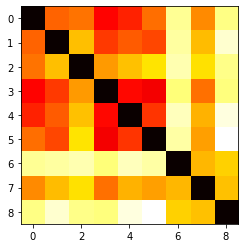

In [0]:
plt.imshow(dist_mat, cmap='hot', interpolation='nearest')
plt.show()

###Embedding Plot

here, we do PCA on the 128 embedding vector and plot the top 3 PCAs and see if the different people can be easily distinguished. 

In [0]:
pca = PCA(n_components=3).fit(np.vstack(embeddings['emb']))
pca

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [0]:
guy_fieri_pca = pca.transform(np.vstack(embeddings.loc[embeddings['name']=='guy_fieri', 'emb']))
barak_obama_pca = pca.transform(np.vstack(embeddings.loc[embeddings['name']=='barak_obama', 'emb']))
samuel_jackson_pca = pca.transform(np.vstack(embeddings.loc[embeddings['name']=='samuel_jackson', 'emb']))


[[ 3.5268023 -1.1443247 -1.1366942]]


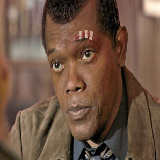

In [0]:
# url = 'https://static.hiphopdx.com/2018/01/180102-Barack-Obama-Getty-800x600.jpg'
url = 'https://www.thewrap.com/wp-content/uploads/2019/03/NickFuryCaptainMarvel.jpg'
# url = 'https://media1.fdncms.com/orlando/imager/u/original/6220103/guyfieri.jpg'
response = requests.get(url)
test_img = Image.open(BytesIO(response.content))

test_img = test_img.resize((160, 160))

input_data = np.expand_dims(test_img, axis=0)
input_data = (np.float32(input_data) - 128) / 128

test_emb = model.predict(input_data)
test_pca = pca.transform(test_emb)
print(test_pca)
test_img

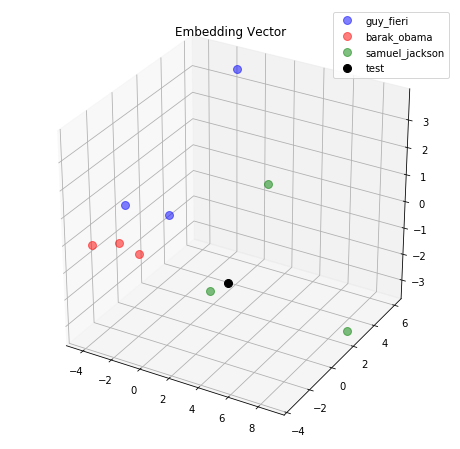

In [0]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection='3d')
plt.rcParams['legend.fontsize'] = 10   
ax.plot(guy_fieri_pca[:,0], guy_fieri_pca[:,1], guy_fieri_pca[:,2],
        'o', markersize=8, color='blue', alpha=0.5, label='guy_fieri')
ax.plot(barak_obama_pca[:,0], barak_obama_pca[:,1], barak_obama_pca[:,2],
        'o', markersize=8, color='red', alpha=0.5, label='barak_obama')
ax.plot(samuel_jackson_pca[:,0], samuel_jackson_pca[:,1], samuel_jackson_pca[:,2],
        'o', markersize=8, color='green', alpha=0.5, label='samuel_jackson')
ax.plot(test_pca[:,0], test_pca[:,1], test_pca[:,2],
        'o', markersize=8, color='black', alpha=1, label='test')

plt.title('Embedding Vector')
ax.legend(loc='upper right')

plt.show()

# Style Transfer

Here, we use intermediate layers of a standard CNN to add some changes to a base image. Here I use VGG as the CNN

based off of https://www.tensorflow.org/tutorials/generative/style_transfer

### Imports

In [1]:
%tensorflow_version 2.x

from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow as tf

import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams['figure.figsize'] = (12,12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

print(tf.__version__)
print(tf.test.is_gpu_available())

TensorFlow 2.x selected.
2.0.0
True


### Load images

In [0]:
def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor)>3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

In [3]:
content_path = tf.keras.utils.get_file(
    '/content/mona_lisa.jpg',
    'https://upload.wikimedia.org/wikipedia/commons/thumb/e/ec/Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg/687px-Mona_Lisa%2C_by_Leonardo_da_Vinci%2C_from_C2RMF_retouched.jpg')

style_path = tf.keras.utils.get_file(
    '/content/mondrian.jpg',
    'https://www.piet-mondrian.org/images/paintings/broadway-boogie-woogie.jpg')

81920/78098 [===============================] - 0s 0us/step


In [0]:
def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img

In [0]:
def imshow(image, title=None):
    if len(image.shape) > 3:
       image = tf.squeeze(image, axis=0)   

    plt.imshow(image)
    if title:
        plt.title(title)

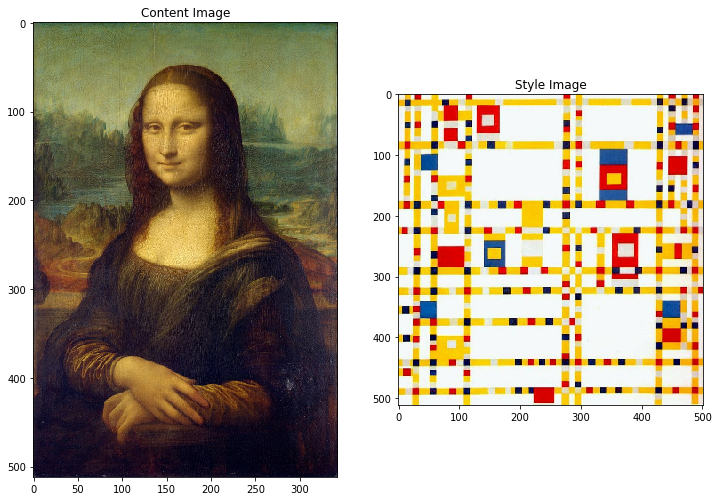

In [6]:
content_image = load_img(content_path)
style_image = load_img(style_path)

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')


### Load VGG model

In [0]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

# Content layer where will pull our feature maps
content_layers = ['block5_conv2'] 

# Style layer of interest
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [0]:
def vgg_layers(layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    # Load our model. Load pretrained VGG, trained on imagenet data
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    
    outputs = [vgg.get_layer(name).output for name in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

In [9]:
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

#Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
    print(name)
    print("  shape: ", output.numpy().shape)
    print("  min: ", output.numpy().min())
    print("  max: ", output.numpy().max())
    print("  mean: ", output.numpy().mean())
    print()

block1_conv1
  shape:  (1, 512, 501, 64)
  min:  0.0
  max:  855.6216
  mean:  45.272476

block2_conv1
  shape:  (1, 256, 250, 128)
  min:  0.0
  max:  5204.5283
  mean:  252.7071

block3_conv1
  shape:  (1, 128, 125, 256)
  min:  0.0
  max:  10816.313
  mean:  331.29584

block4_conv1
  shape:  (1, 64, 62, 512)
  min:  0.0
  max:  27400.994
  mean:  1134.1799

block5_conv1
  shape:  (1, 32, 31, 512)
  min:  0.0
  max:  3866.085
  mean:  74.43305



### define loss

In [0]:
def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return result/(num_locations)

In [0]:
class StyleContentModel(tf.keras.models.Model):
    def __init__(self, style_layers, content_layers):
        super(StyleContentModel, self).__init__()
        self.vgg =  vgg_layers(style_layers + content_layers)
        self.style_layers = style_layers
        self.content_layers = content_layers
        self.num_style_layers = len(style_layers)
        self.vgg.trainable = False

    def call(self, inputs):
        "Expects float input in [0,1]"
        inputs = inputs*255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = self.vgg(preprocessed_input)
        style_outputs, content_outputs = (outputs[:self.num_style_layers], 
                                        outputs[self.num_style_layers:])

        style_outputs = [gram_matrix(style_output)
                        for style_output in style_outputs]

        content_dict = {content_name:value 
                        for content_name, value 
                        in zip(self.content_layers, content_outputs)}

        style_dict = {style_name:value
                    for style_name, value
                    in zip(self.style_layers, style_outputs)}
        
        return {'content':content_dict, 'style':style_dict}

In [12]:
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

style_results = results['style']

print('Styles:')
for name, output in sorted(results['style'].items()):
    print("  ", name)
    print("    shape: ", output.numpy().shape)
    print("    min: ", output.numpy().min())
    print("    max: ", output.numpy().max())
    print("    mean: ", output.numpy().mean())
    print()

print("Contents:")
for name, output in sorted(results['content'].items()):
    print("  ", name)
    print("    shape: ", output.numpy().shape)
    print("    min: ", output.numpy().min())
    print("    max: ", output.numpy().max())
    print("    mean: ", output.numpy().mean())

Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.0
    max:  24196.812
    mean:  366.96454

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  60554.703
    mean:  9426.717

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  197641.62
    mean:  8067.2715

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  4543734.0
    mean:  176851.17

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  69175.49
    mean:  1196.8611

Contents:
   block5_conv2
    shape:  (1, 32, 21, 512)
    min:  0.0
    max:  1276.2563
    mean:  12.871968


In [0]:
def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)


In [0]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

image = tf.Variable(content_image)

opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

style_weight=1e-2
content_weight=1e4

In [0]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss


In [0]:
@tf.function()
def train_step(image):
    with tf.GradientTape() as tape:
        outputs = extractor(image)
        loss = style_content_loss(outputs)

    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))


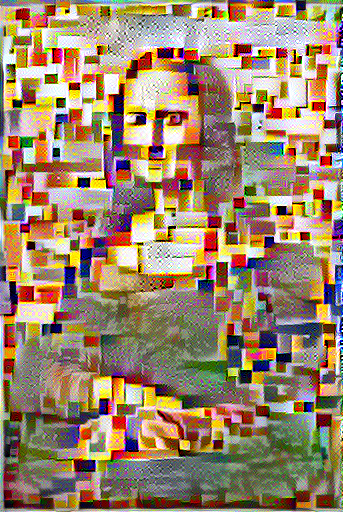

Train step: 1000
Total time: 74.4


In [17]:
import time
start = time.time()

epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
    for m in range(steps_per_epoch):
        step += 1
        train_step(image)
        print(".", end='')
    display.clear_output(wait=True)
    display.display(tensor_to_image(image))
    print("Train step: {}".format(step))
  
end = time.time()
print("Total time: {:.1f}".format(end-start))

# Faster RCNN

Using the prebuilt models from tfhub



### Imports

In [1]:
%matplotlib inline
%tensorflow_version 2.x

# For running inference on the TF-Hub module.
import tensorflow as tf

import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# For measuring the inference time.
import time

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

TensorFlow 2.x selected.
The following GPU devices are available: /device:GPU:0


### Helper functions

Helps load images and display the bounding boxes properly

In [0]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)


def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename


def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = bottom + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

### Load Image

Image downloaded to /tmp/tmpy4fsjfsf.jpg.


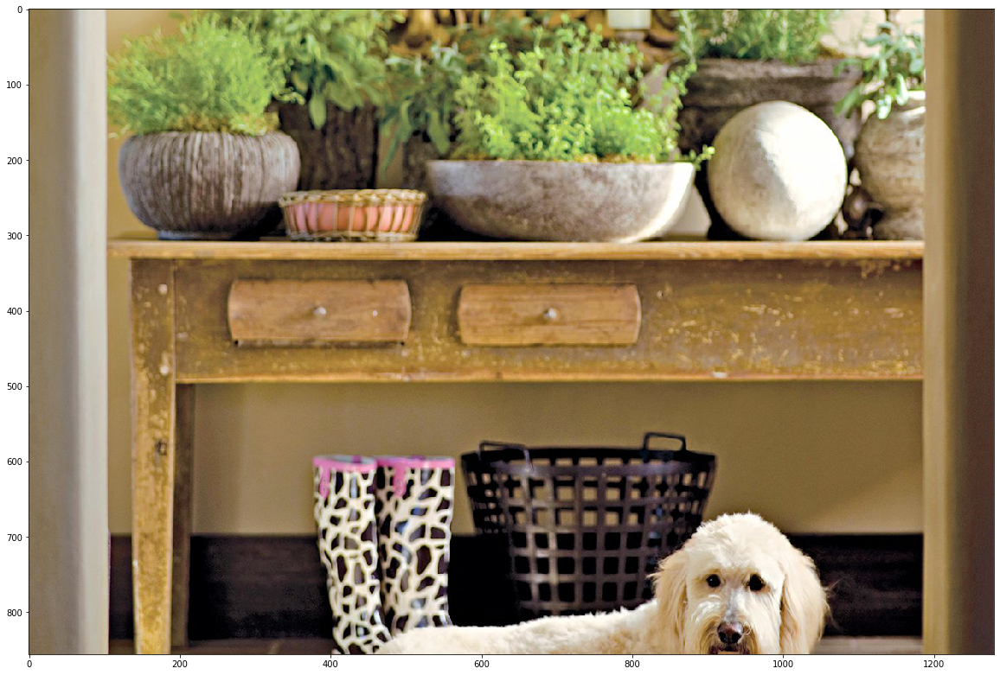

In [4]:
image_url = "https://imagesvc.meredithcorp.io/v3/mm/image?url=https%3A%2F%2Fstatic.onecms.io%2Fwp-content%2Fuploads%2Fsites%2F37%2F2019%2F01%2F15214605%2Fwhite-dog-lying-entry-near-herb-containers-4a5c7f8e.jpg&q=85" 
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

### Load Model

In [5]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1" 

detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [0]:
def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img

### Detect

In [0]:
def run_detector(detector, path):
    img = load_img(path)

    converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()

    result = {key:value.numpy() for key,value in result.items()}

    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time-start_time)

    image_with_boxes = draw_boxes(
        img.numpy(), result["detection_boxes"],
        result["detection_class_entities"], result["detection_scores"])

    display_image(image_with_boxes)

Found 100 objects.
Inference time:  50.42334032058716


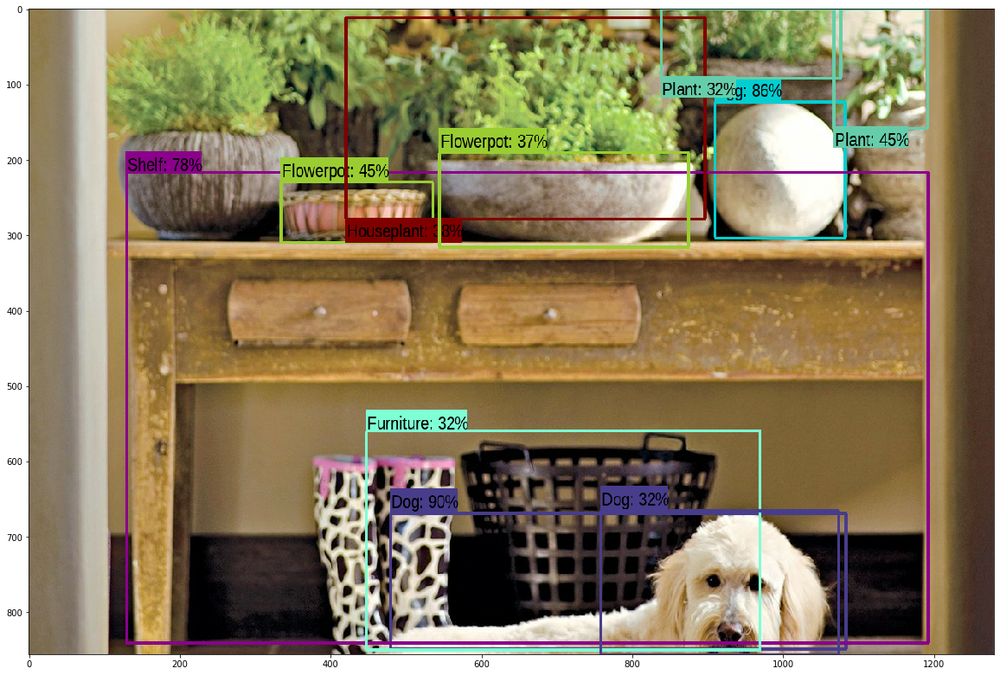

In [8]:
run_detector(detector, downloaded_image_path)

Image downloaded to /tmp/tmpj5yu_un6.jpg.
Found 100 objects.
Inference time:  2.9267148971557617


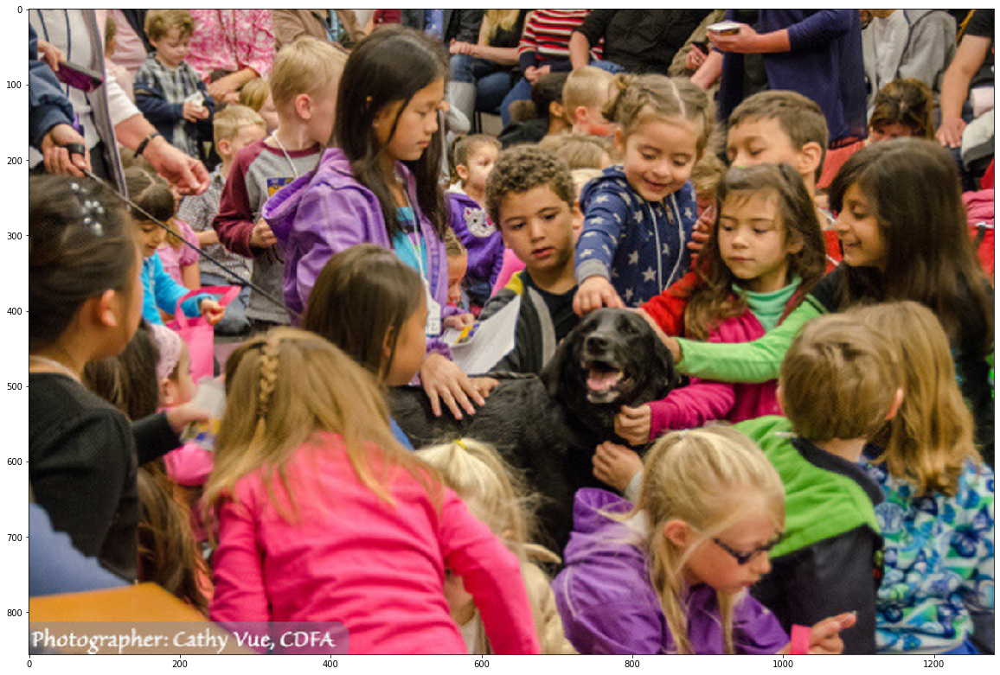

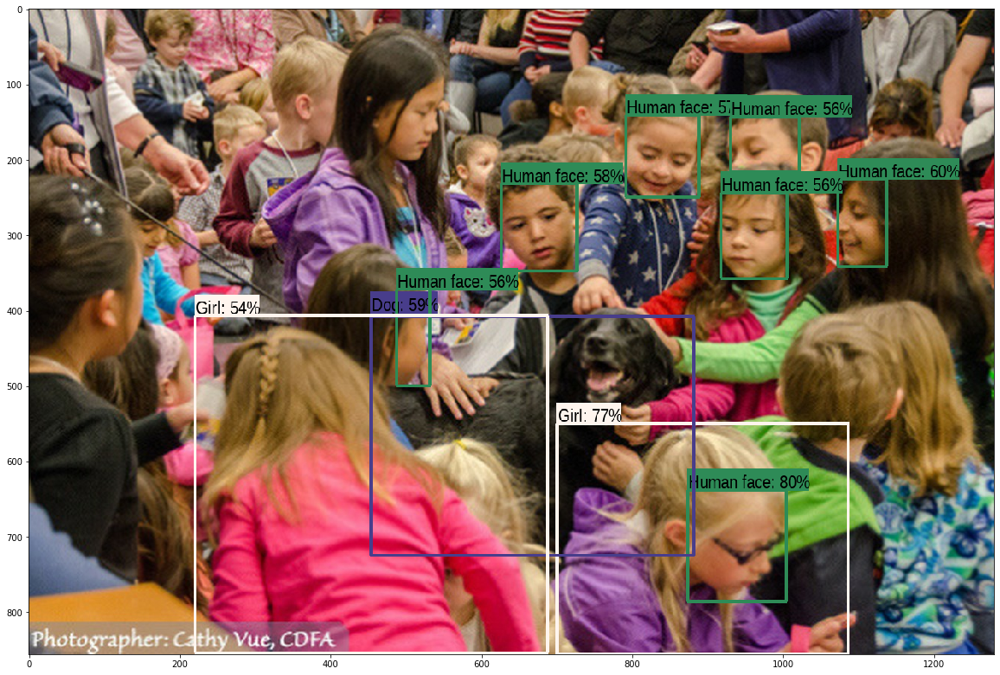

In [9]:
image_url = "https://www.cdfa.ca.gov/plant/dogteams/photos_fg/Bart/Bart-big.png" 
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

run_detector(detector, downloaded_image_path)

# Masked RCNN

Using prebuilt models from gluon

https://gluon-cv.mxnet.io/build/examples_instance/demo_mask_rcnn.html

### Imports

In [1]:
!pip install gluoncv
!pip install mxnet

In [0]:
from matplotlib import pyplot as plt
from gluoncv import model_zoo, data, utils

### Load model

In [0]:
net = model_zoo.get_model('mask_rcnn_resnet50_v1b_coco', pretrained=True)


### Load Image

In [0]:
im_fname = utils.download('https://cf-images.us-east-1.prod.boltdns.net/v1/static/5615998029001/bc70736b-9af3-4951-b37d-9601f5cb8891/1ecc2462-abe9-41ff-a356-f8a9fd65c585/1280x720/match/image.jpg',
                          path='dog_park.jpg')
x, orig_img = data.transforms.presets.rcnn.load_test(im_fname)

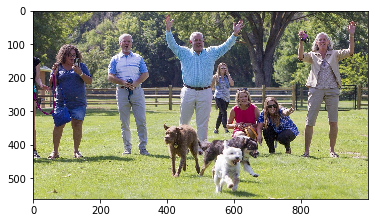

In [5]:
plt.imshow(orig_img)

### Predict

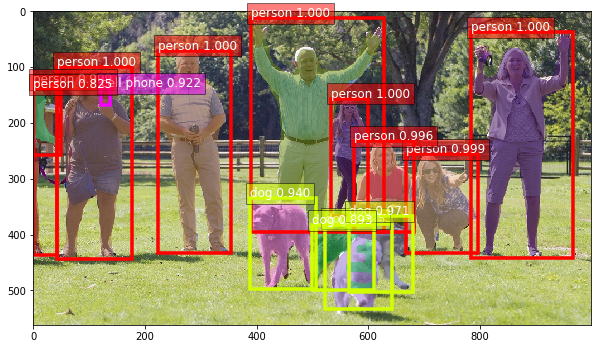

In [6]:
ids, scores, bboxes, masks = [xx[0].asnumpy() for xx in net(x)]

# paint segmentation mask on images directly
width, height = orig_img.shape[1], orig_img.shape[0]
masks, _ = utils.viz.expand_mask(masks, bboxes, (width, height), scores)
orig_img = utils.viz.plot_mask(orig_img, masks)

# identical to Faster RCNN object detection
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(1, 1, 1)
ax = utils.viz.plot_bbox(orig_img, bboxes, scores, ids,
                         class_names=net.classes, ax=ax)
plt.show()

# Stock Market Prediction with LSTM

# Imports


In [1]:
%matplotlib inline
%tensorflow_version 2.x

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


from keras.models import Sequential
from keras.layers import LSTM,Dense

import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.models import load_model, Model, Sequential
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array


from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

print(tf.__version__)
print(tf.test.is_gpu_available())

TensorFlow 2.x selected.


Using TensorFlow backend.


2.0.0
True


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
data = pd.read_csv('/content/drive/My Drive/297-98/all_stocks_5yr.csv')
cl = data[data['Name']=='MMM'].Close

cl.head()

0    92.40
1    92.30
2    92.54
3    93.74
4    94.24
Name: Close, dtype: float64

In [4]:
scl = MinMaxScaler()
#Scale the data between 0,1
cl = cl.values.reshape(cl.shape[0],1)
cl = scl.fit_transform(cl)
cl

array([[0.0403808 ],
       [0.03958747],
       [0.04149147],
       ...,
       [0.94541848],
       [0.94343514],
       [0.9414518 ]])

In [5]:
def processData(data,lb):
    X,Y = [],[]
    for i in range(len(data)-lb-1):
        X.append(data[i:(i+lb),0])
        Y.append(data[(i+lb),0])
    return np.array(X),np.array(Y)
X,y = processData(cl,7)
X_train,X_test = X[:int(X.shape[0]*0.80)],X[int(X.shape[0]*0.80):]
y_train,y_test = y[:int(y.shape[0]*0.80)],y[int(y.shape[0]*0.80):]
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)



(1000, 7)
(250, 7)
(1000,)
(250,)


In [0]:
#Reshape data for (Sample,Timestep,Features) 
X_train = X_train.reshape((X_train.shape[0],X_train.shape[1],1))
X_test = X_test.reshape((X_test.shape[0],X_test.shape[1],1))

In [10]:
#Build the model
model = Sequential()
model.add(LSTM(256,input_shape=(7,1)))
model.add(Dense(1))
model.compile(optimizer='adam',loss='mse')
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 256)               264192    
_________________________________________________________________
dense (Dense)                (None, 1)                 257       
Total params: 264,449
Trainable params: 264,449
Non-trainable params: 0
_________________________________________________________________


In [14]:
#Fit model with history to check for overfitting
history = model.fit(
    X_train, y_train,
    epochs=300,
    validation_data=(X_test,y_test),
    shuffle=False)

Train on 1000 samples, validate on 250 samples
Epoch 1/300
1000/1000 [==============================] - 4s 4ms/sample - loss: 0.0014 - val_loss: 0.0020
Epoch 2/300
1000/1000 [==============================] - 0s 250us/sample - loss: 0.0076 - val_loss: 0.0030
Epoch 3/300
1000/1000 [==============================] - 0s 246us/sample - loss: 0.0046 - val_loss: 0.0028
Epoch 4/300
1000/1000 [==============================] - 0s 259us/sample - loss: 0.0019 - val_loss: 4.9701e-04
Epoch 5/300
1000/1000 [==============================] - 0s 258us/sample - loss: 0.0017 - val_loss: 8.8864e-04
Epoch 6/300
1000/1000 [==============================] - 0s 252us/sample - loss: 0.0027 - val_loss: 0.0013
Epoch 7/300
1000/1000 [==============================] - 0s 247us/sample - loss: 6.3097e-04 - val_loss: 5.7782e-04
Epoch 8/300
1000/1000 [==============================] - 0s 270us/sample - loss: 5.7454e-04 - val_loss: 5.0418e-04
Epoch 9/300
1000/1000 [==============================] - 0s 272us/sample - 

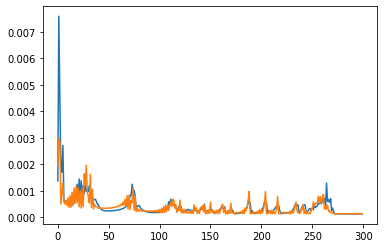

In [15]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

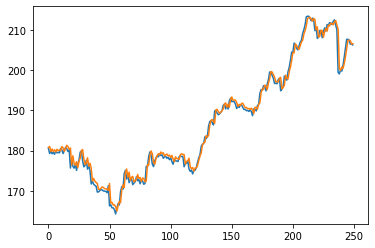

In [16]:
Xt = model.predict(X_test)
plt.plot(scl.inverse_transform(y_test.reshape(-1,1)))
plt.plot(scl.inverse_transform(Xt))

In [17]:
act = []
pred = []
#for i in range(250):
i=249
Xt = model.predict(X_test[i].reshape(1,7,1))
print('predicted:{0}, actual:{1}'.format(scl.inverse_transform(Xt),scl.inverse_transform(y_test[i].reshape(-1,1))))
pred.append(scl.inverse_transform(Xt))
act.append(scl.inverse_transform(y_test[i].reshape(-1,1)))

predicted:[[206.56102]], actual:[[206.23]]


# Wavenet

In [10]:
model = keras.models.Sequential()
model.add(keras.layers.InputLayer(input_shape=(None,1)))

for rate in (1,2,4,8) * 2:
    model.add(keras.layers.Conv1D(filters=20, kernel_size=2, padding='causal', activation='relu', dilation_rate=rate))

model.add(keras.layers.Conv1D(filters=10, kernel_size=1))
model.add(keras.layers.Dense(1))

model.compile(loss='mse', optimizer='adam')
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_18 (Conv1D)           (None, None, 20)          60        
_________________________________________________________________
conv1d_19 (Conv1D)           (None, None, 20)          820       
_________________________________________________________________
conv1d_20 (Conv1D)           (None, None, 20)          820       
_________________________________________________________________
conv1d_21 (Conv1D)           (None, None, 20)          820       
_________________________________________________________________
conv1d_22 (Conv1D)           (None, None, 20)          820       
_________________________________________________________________
conv1d_23 (Conv1D)           (None, None, 20)          820       
_________________________________________________________________
conv1d_24 (Conv1D)           (None, None, 20)         

In [11]:
history = model.fit(
    X_train, y_train,
    epochs=300,
    validation_data=(X_test,y_test),
    )

Train on 1000 samples, validate on 250 samples
Epoch 1/300
1000/1000 [==============================] - 6s 6ms/sample - loss: 0.0902 - val_loss: 0.0932
Epoch 2/300
1000/1000 [==============================] - 0s 202us/sample - loss: 0.0267 - val_loss: 0.0576
Epoch 3/300
1000/1000 [==============================] - 0s 197us/sample - loss: 0.0085 - val_loss: 0.0083
Epoch 4/300
1000/1000 [==============================] - 0s 203us/sample - loss: 0.0017 - val_loss: 0.0034
Epoch 5/300
1000/1000 [==============================] - 0s 210us/sample - loss: 8.4478e-04 - val_loss: 0.0017
Epoch 6/300
1000/1000 [==============================] - 0s 207us/sample - loss: 6.4985e-04 - val_loss: 0.0017
Epoch 7/300
1000/1000 [==============================] - 0s 205us/sample - loss: 5.9960e-04 - val_loss: 0.0021
Epoch 8/300
1000/1000 [==============================] - 0s 204us/sample - loss: 6.0166e-04 - val_loss: 0.0019
Epoch 9/300
1000/1000 [==============================] - 0s 206us/sample - loss: 5.

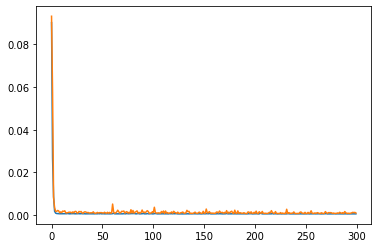

In [12]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

ValueError: ignored

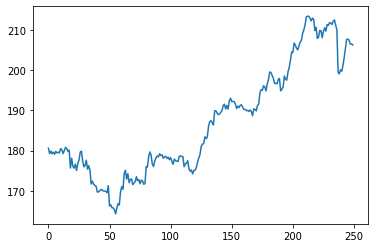

In [13]:
Xt = model.predict(X_test)
plt.plot(scl.inverse_transform(y_test.reshape(-1,1)))
plt.plot(scl.inverse_transform(Xt))

In [14]:
act = []
pred = []
#for i in range(250):
i=249
Xt = model.predict(X_test[i].reshape(1,7,1))
print('predicted:{0}, actual:{1}'.format(scl.inverse_transform(Xt),scl.inverse_transform(y_test[i].reshape(-1,1))))
pred.append(scl.inverse_transform(Xt))
act.append(scl.inverse_transform(y_test[i].reshape(-1,1)))

ValueError: ignored